# Screentone Removal / Image to Line Converter

Goes through three levels of processing:

1. Denoising (Screentone to soft-shade conversion)
2. Laplace of Gaussian Filter (LoG, Edge Detection)
3. Union-Find (speckle remover)

For most cases, LoG after denoising is effective in Screentone Removal.

Limitations:

- Line thickness
- speckle removal near lines
- uneven line tone (cause by surrounding shades)
- Denoising non-screentoend images reduces its quality
- small lines like the mouth tend to disappear from speckle removal

### Initialize Python

In [1]:
%matplotlib inline


###WARNING!!!! REMOVE THIS IF YOUR COMPUTER IS CHEAP!!!###
# INCREASES THE RECURSION LIMIT
import resource, sys
resource.setrlimit(resource.RLIMIT_STACK, (2**29,-1))
sys.setrecursionlimit(10**6)

##########################################################


### Import Modules

In [3]:
import scipy as sp
import numpy as np
import cv2
from matplotlib import pyplot as plt
from scipy import signal as ssignal
from numpy import matrix
from numpy import amax

### Union Find Algorithm for 2D Matrices (1-Layer Images)
-A graph algorithm that can group nodes of together. 

Later on, we will use this algorithm to connect adjecent dark pixels together for the speckle removal

In [4]:
def find(leader,n):
    x,y = n
    if (x,y) != leader[x][y]:
        leader[x][y] = find(leader, leader[x][y])
    return leader[x][y]

def connect(leader,size, a, b):
    la, lb = find(leader, a), find(leader, b)
    if la == lb:
        return
    if la < lb:
        la, lb = lb, la
    (xb,yb) = lb
    (xa,ya) = la
    leader[xb][yb] = la
    size[xa][ya] += size[xb][yb] 

def query(leader, a, b):
    return find(leader, a) == find(leader, b)

### Image to be processed:

Text(0.5, 1.0, 'Input')

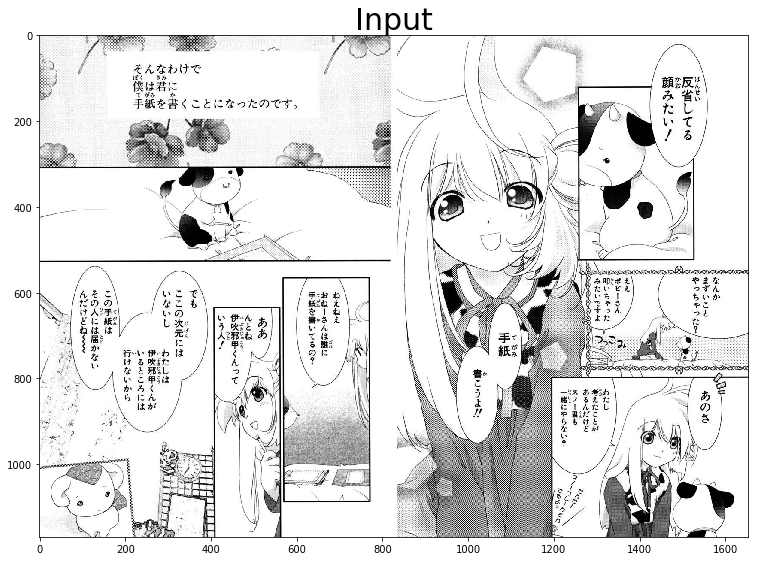

In [41]:
img = "076.jpg"

img0 = cv2.imread(img,)
gray = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY) * 1.0
plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(411),plt.imshow(gray,cmap = 'gray')
plt.title('Input',fontsize=30)

### Denoising

Text(0.5, 1.0, 'Denoised Input')

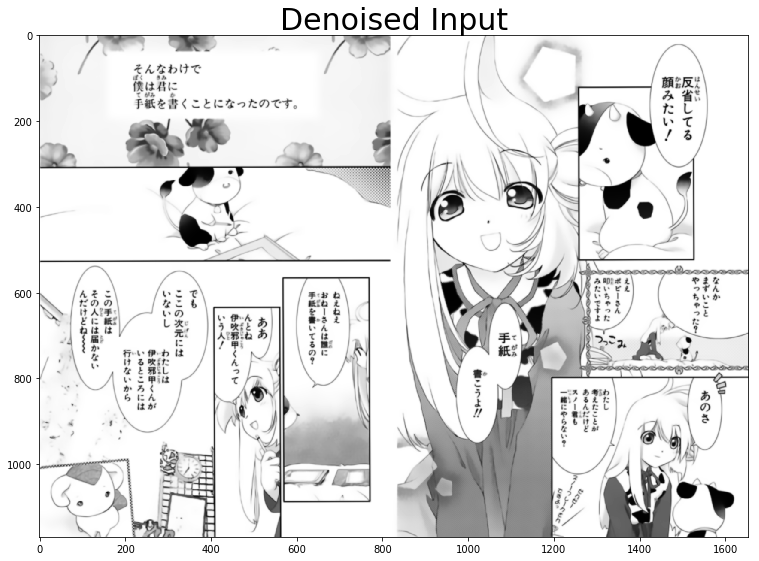

In [42]:
gray = np.uint8(gray)
cv2.fastNlMeansDenoising(gray,gray,10)
gray = cv2.resize(gray,(1170,1170*img0.shape[0]//img0.shape[1])) #Magic happens here for some odd reason :)            
gray = cv2.resize(gray,(img0.shape[1],img0.shape[0]))
gray = cv2.GaussianBlur(gray,(3,3),0)
cv2.fastNlMeansDenoising(gray,gray,20)
img1 = gray * 1.0

plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(411),plt.imshow(gray,cmap = 'gray')
plt.title('Denoised Input',fontsize=30)
    

### Laplace of Gaussian Filter (Edge Detection)

Text(0.5, 1.0, 'LoG on Denoised')

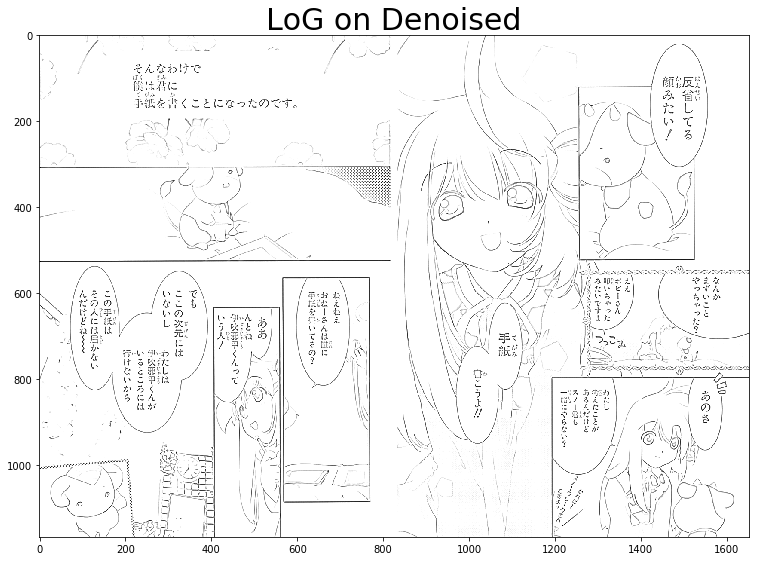

In [43]:
kernel = [[0,1,0],[1,-4,1],[0,1,0]]
for i in range(1,19):
  conv = ssignal.convolve(img1, kernel, mode='valid')

thres = np.absolute(conv).mean() * 0.75
np.matrix.clip(conv,thres, 255, out=conv)
conv = (conv - thres)
conv *= 255/np.max(conv)

conv  = (amax(conv) - conv)
conv  = conv*conv/255

conv_old = np.copy(conv)

plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(413),plt.imshow(conv_old,cmap = 'gray')
plt.title('LoG on Denoised',fontsize=30)

### Union Find on Dark Pixels - Despeckle
1. Group connecter dark areas (a.k.a. lines) together
2. remove small groups of dark areas (speckes)

Text(0.5, 1.0, 'LoG w/ Union Find')

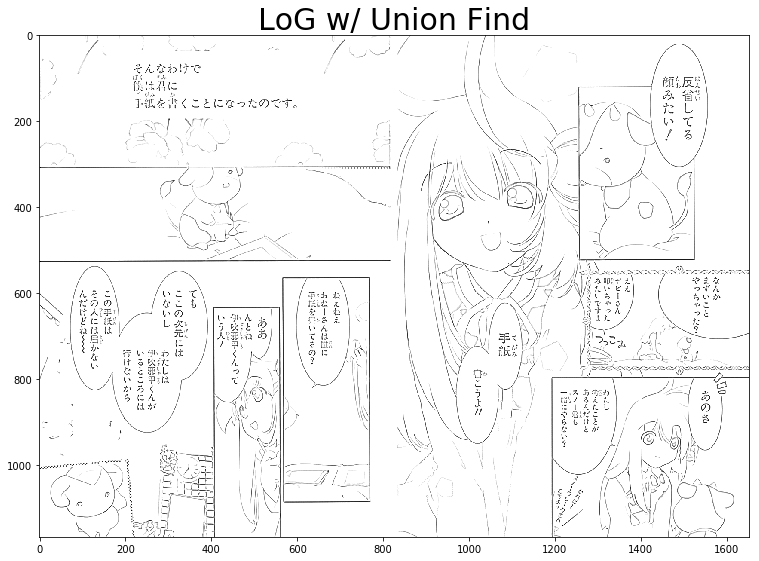

In [44]:
#Union Find Screentone Removal
leader = [[(i,j) for j in range(conv.shape[1])] for i in range(conv.shape[0])]
size = [[1 for j in range(conv.shape[1])] for i in range(conv.shape[0])]
for i in range(conv.shape[0]-1):
    for j in range(conv.shape[1]-1):
        if conv[i][j] < 250:
            if i != 0 and conv[i-1][j] < 250:
                connect(leader,size,leader[i][j],leader[i-1][j])
            if j != 0 and conv[i][j-1] < 250:
                connect(leader,size,leader[i][j],leader[i][j-1])\

for i in range(conv.shape[0]-1):
    for j in range(conv.shape[1]-1):
        x,y = find(leader,(i,j))
        if (size[x][y] <= 16):
            conv[i][j] = 255



plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(411),plt.imshow(conv,cmap = 'gray')
plt.title('LoG w/ Union Find',fontsize=30)

### Even Line Darkness + Bold Lines

Text(0.5, 1.0, 'Output')

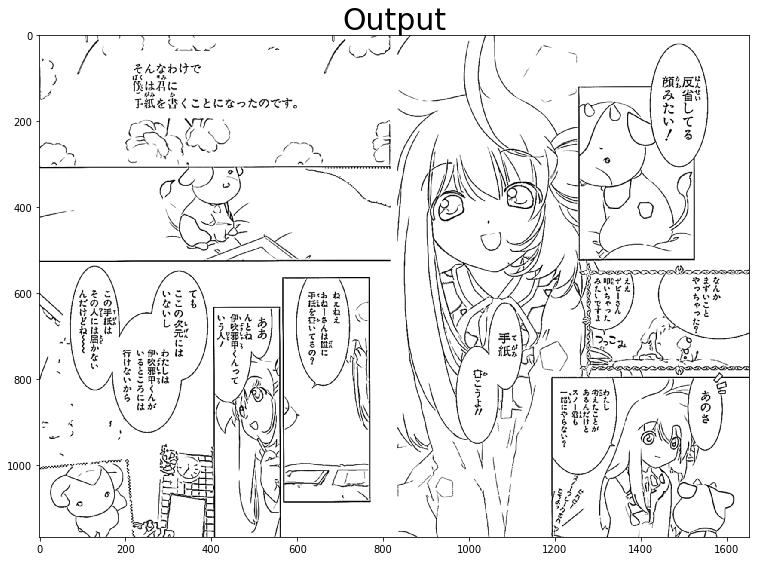

In [45]:
for i in range(conv.shape[0]):
    for j in range(conv.shape[1]):
        if conv[i][j] < 250:
            conv[i][j] *= (conv[i][j]/255)**10
        else: 
            conv[i][j] = 255
conv = cv2.GaussianBlur(conv,(3,3),0)
cv2.imwrite('erode.png',gray)            
cv2.imwrite('LoG.png',conv_old)
cv2.imwrite('LoG_UF.png',conv)

plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
plt.subplot(411),plt.imshow(conv,cmap = 'gray')
plt.title('Output',fontsize=30)

### Screentone Removal Function

In [46]:
def STRemoval(img):
    img0 = cv2.imread(img,)
    gray = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY) * 1.0
    orig_gray = gray
    gray = np.uint8(gray)
    cv2.fastNlMeansDenoising(gray,gray,10)
    gray = cv2.resize(gray,(1170,1170*img0.shape[0]//img0.shape[1])) #Magic happens here for some odd reason :)            
    gray = cv2.resize(gray,(img0.shape[1],img0.shape[0]))
    gray = cv2.GaussianBlur(gray,(3,3),0)
    cv2.fastNlMeansDenoising(gray,gray,20)
    img1 = gray * 1.0
    kernel = [[0,1,0],[1,-4,1],[0,1,0]]

    for i in range(1,19):
      conv = ssignal.convolve(img1, kernel, mode='valid')

    thres = np.absolute(conv).mean() * 0.75
    np.matrix.clip(conv,thres, 255, out=conv)
    conv = (conv - thres)
    conv *= 255/np.max(conv)
    
    conv  = (amax(conv) - conv)
    conv  = conv*conv/255
    conv_old = np.copy(conv)

    #Union Find Screentone Removal
    leader = [[(i,j) for j in range(conv.shape[1])] for i in range(conv.shape[0])]
    size = [[1 for j in range(conv.shape[1])] for i in range(conv.shape[0])]
    for i in range(conv.shape[0]-1):
        for j in range(conv.shape[1]-1):
            if conv[i][j] < 250:
                if i != 0 and conv[i-1][j] < 250:
                    connect(leader,size,leader[i][j],leader[i-1][j])
                if j != 0 and conv[i][j-1] < 250:
                    connect(leader,size,leader[i][j],leader[i][j-1])\

    for i in range(conv.shape[0]-1):
        for j in range(conv.shape[1]-1):
            x,y = find(leader,(i,j))
            if (size[x][y] <= 16):
                conv[i][j] = 255

    for i in range(conv.shape[0]):
        for j in range(conv.shape[1]):
            if conv[i][j] < 250:
                conv[i][j] *= (conv[i][j]/255)**10
            else: 
                conv[i][j] = 255
    conv = cv2.GaussianBlur(conv,(3,3),0)
    cv2.imwrite('erode.png',gray)            
    cv2.imwrite('LoG.png',conv_old)
    cv2.imwrite('LoG_UF.png',conv)

    plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
    plt.subplot(411),plt.imshow(orig_gray,cmap = 'gray')
    plt.title('Input',fontsize=30), plt.xticks([]), plt.yticks([])
    plt.subplot(412),plt.imshow(gray,cmap = 'gray')
    plt.title('Denoised Input',fontsize=30), plt.xticks([]), plt.yticks([])
    plt.subplot(413),plt.imshow(conv_old,cmap = 'gray')
    plt.title('LoG on Denoised',fontsize=30), plt.xticks([]), plt.yticks([])
    plt.subplot(414),plt.imshow(conv,cmap = 'gray')
    plt.title('LoG w/ Union Find',fontsize=30), plt.xticks([]), plt.yticks([])

### Other Examples

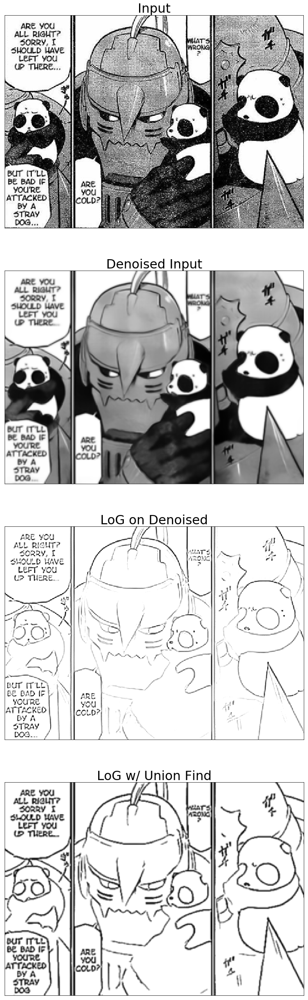

In [48]:
STRemoval('al.png')

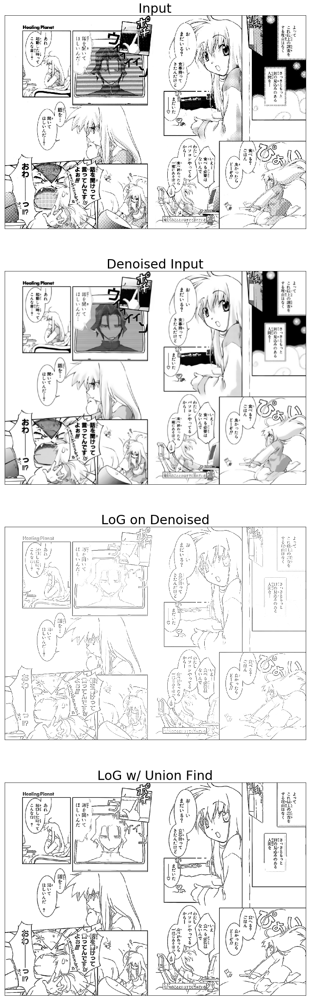

In [49]:
STRemoval('008.jpg')

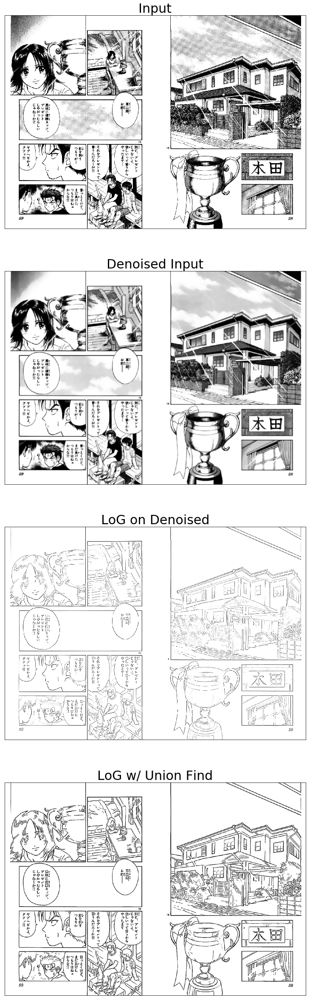

In [50]:
STRemoval('028.jpg')

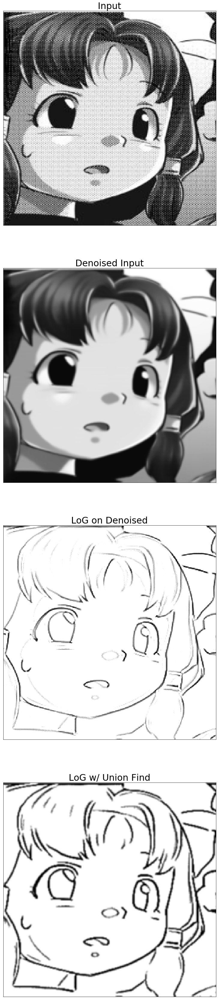

In [51]:
STRemoval('test2.png')

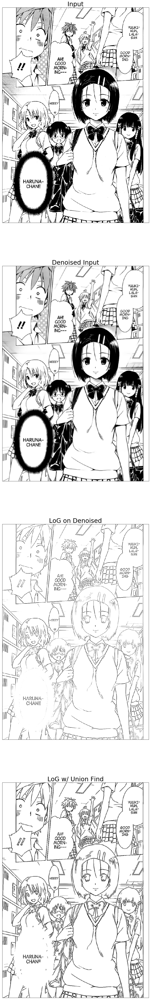

In [52]:
STRemoval('047l.png')

### Image to Line Converter
-Similar to Screentone Removal but without denoising

In [95]:
def STRemoval_2(img):
    img0 = cv2.imread(img,)
    gray = cv2.cvtColor(img0, cv2.COLOR_BGR2GRAY) * 1.0
    orig_gray = gray * 1.0
    gray = cv2.GaussianBlur(gray,(3,3),0)
    img1 = gray * 1.0
    kernel = [[0,1,0],[1,-4,1],[0,1,0]]

    conv = ssignal.convolve(img1, kernel, mode='valid')

    thres = np.absolute(conv).mean() * 0.75
    np.matrix.clip(conv,0, 255, out=conv)
    conv *= 255/np.max(conv)
    conv  = (amax(conv) - conv)
    conv_old = np.copy(conv)

    #Union Find Screentone Removal
    thres  = np.absolute(np.clip(conv,100, 255)).mean()
    leader = [[(i,j) for j in range(conv.shape[1])] for i in range(conv.shape[0])]
    size = [[1 for j in range(conv.shape[1])] for i in range(conv.shape[0])]
    for i in range(conv.shape[0]-1):
        for j in range(conv.shape[1]-1):
            if conv[i][j] < 232:
                if i != 0 and conv[i-1][j] < 232:
                    connect(leader,size,leader[i][j],leader[i-1][j])
                if j != 0 and conv[i][j-1] < 232:
                    connect(leader,size,leader[i][j],leader[i][j-1])

    for i in range(conv.shape[0]-1):
        for j in range(conv.shape[1]-1):
            x,y = find(leader,(i,j))
            if (size[x][y] <= 16):
                conv[i][j] = 255
                
    conv = cv2.erode(conv,np.ones((2,2),np.uint8))
                
    
    for i in range(conv.shape[0]):
        for j in range(conv.shape[1]):
            if conv[i][j] < 232:
                conv[i][j] = (orig_gray[i][j])
            else: 
                conv[i][j] = 255
                
#     conv = cv2.GaussianBlur(conv,(3,3),0)

    plt.figure(figsize=(60,60*img0.shape[0]/img0.shape[1]))
    plt.subplot(411),plt.imshow(cv2.cvtColor(img0, cv2.COLOR_BGR2RGB))
    plt.title('Input',fontsize=30), plt.xticks([]), plt.yticks([])
    plt.subplot(412),plt.imshow(orig_gray,cmap = 'gray')
    plt.title('Grayscale',fontsize=30), plt.xticks([]), plt.yticks([])
    plt.subplot(413),plt.imshow(conv_old,cmap = 'gray')
    plt.title('LoG',fontsize=30), plt.xticks([]), plt.yticks([])
    plt.subplot(414),plt.imshow(conv,cmap = 'gray')
    plt.title('LoG w/ Union Find',fontsize=30), plt.xticks([]), plt.yticks([])

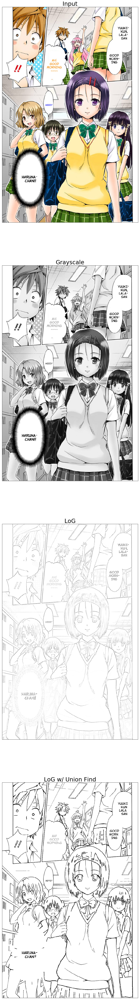

In [96]:
STRemoval_2('../047.jpg')